<a href="https://colab.research.google.com/github/lyeonsl/2025-Beyond-Summer-Project_library_seat_detection/blob/main/2025_Beyond_Summer_Project_W5_Test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 5주차(비대면): YOLO 구글코랩으로 실습
> 데이터 증강 x

### 데이터 불러오기 및 YOLO 설치

In [1]:
from google.colab import files
uploaded = files.upload()  # zip 파일 업로드

Saving Beyond.v2i.yolov8.zip to Beyond.v2i.yolov8.zip


In [2]:
import zipfile
import os

zip_path = "/content/Beyond.v2i.yolov8.zip"
extract_dir = "/content/Beyond.v2i.yolov8"

# 압축 해제
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

# 기존 데이터 경로
base_path = '/content/Beyond.v2i.yolov8'
img_dir = os.path.join(base_path, 'train/images')
lbl_dir = os.path.join(base_path, 'train/labels')

# 출력 경로
train_img_dir = os.path.join(base_path, 'images/train')
val_img_dir   = os.path.join(base_path, 'images/val')
train_lbl_dir = os.path.join(base_path, 'labels/train')
val_lbl_dir   = os.path.join(base_path, 'labels/val')

# 디렉토리 생성
for d in [train_img_dir, val_img_dir, train_lbl_dir, val_lbl_dir]:
    os.makedirs(d, exist_ok=True)

# 이미지 파일 리스트
img_files = [f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png'))]

# 학습/검증 분할
train_imgs, val_imgs = train_test_split(img_files, test_size=0.2, random_state=42)

def move_data(file_list, src_img_dir, src_lbl_dir, dst_img_dir, dst_lbl_dir):
    for f in file_list:
        img_src = os.path.join(src_img_dir, f)
        lbl_src = os.path.join(src_lbl_dir, os.path.splitext(f)[0] + '.txt')

        img_dst = os.path.join(dst_img_dir, f)
        lbl_dst = os.path.join(dst_lbl_dir, os.path.splitext(f)[0] + '.txt')

        shutil.copyfile(img_src, img_dst)
        if os.path.exists(lbl_src):
            shutil.copyfile(lbl_src, lbl_dst)

# 이동 실행
move_data(train_imgs, img_dir, lbl_dir, train_img_dir, train_lbl_dir)
move_data(val_imgs, img_dir, lbl_dir, val_img_dir, val_lbl_dir)

print("기존 이미지/라벨 → train/val 분할 완료")

기존 이미지/라벨 → train/val 분할 완료


In [4]:
import os

# 디렉토리 경로 설정
base_dir = '/content/Beyond.v2i.yolov8/images'
subdirs = ['train', 'val']

# 이미지 확장자 정의 (YOLO에서 주로 사용되는 포맷들)
image_extensions = ['.jpg', '.jpeg', '.png', '.bmp']

# 각 폴더에 있는 이미지 개수 출력
for subdir in subdirs:
    folder_path = os.path.join(base_dir, subdir)
    image_count = len([
        f for f in os.listdir(folder_path)
        if os.path.splitext(f)[1].lower() in image_extensions
    ])
    print(f"{subdir} 이미지 개수: {image_count}장")

train 이미지 개수: 186장
val 이미지 개수: 47장


In [9]:
import yaml

class_names = ['empty', 'occupied']

data = {
    'train': '/content/Beyond.v2i.yolov8/images/train',
    'val': '/content/Beyond.v2i.yolov8/images/val',
    'test': '/content/Beyond.v2i.yolov8/val',
    'names': {i: name for i, name in enumerate(class_names)},
    'nc': len(class_names)
}

yaml_path = '/content/Beyond.v2i.yolov8/dataset.yaml'

with open(yaml_path, 'w') as f:
    yaml.dump(data, f, default_flow_style=False)

print(f"dataset.yaml 파일 생성 완료: {yaml_path}")

dataset.yaml 파일 생성 완료: /content/Beyond.v2i.yolov8/dataset.yaml


In [10]:
# ultralytics 설치
!pip install ultralytics

In [7]:
# 모델 로드
from ultralytics import YOLO
model = YOLO("yolov8n.pt")  # 경량 모델 (또는 yolov8s.pt 등 가능)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### 640 x 640

In [11]:
# 모델 학습 시작
model.train(
    data=yaml_path,        # data.yaml 경로
    epochs=50,
    imgsz=640,
    batch=16,
    name="yolov8_chair"
)

Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Beyond.v2i.yolov8/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_chair2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, po

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

 21                  -1  1    493056  ultralytics.nn.modules.block.C2f             [384, 256, 1]                 
 22        [15, 18, 21]  1    751702  ultralytics.nn.modules.head.Detect           [2, [64, 128, 256]]           
Model summary: 129 layers, 3,011,238 parameters, 3,011,222 gradients, 8.2 GFLOPs

Transferred 319/355 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks...


AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 51.0±30.0 MB/s, size: 75.2 KB)


train: Scanning /content/Beyond.v2i.yolov8/labels/train... 186 images, 0 backgrounds, 0 corrupt: 100%|██████████| 186/186 [00:00<00:00, 506.14it/s]

train: New cache created: /content/Beyond.v2i.yolov8/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 24.3±9.8 MB/s, size: 69.2 KB)


val: Scanning /content/Beyond.v2i.yolov8/labels/val... 47 images, 0 backgrounds, 0 corrupt: 100%|██████████| 47/47 [00:00<00:00, 364.19it/s]

val: New cache created: /content/Beyond.v2i.yolov8/labels/val.cache


Plotting labels to runs/detect/yolov8_chair2/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8_chair2
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50       2.4G      2.044      3.422      1.688        120        640: 100%|██████████| 12/12 [00:07<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.39s/it]

                   all         47        587     0.0165      0.485     0.0865     0.0358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      2.58G       1.94      2.266      1.522        215        640: 100%|██████████| 12/12 [00:03<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.54it/s]


                   all         47        587     0.0243      0.565      0.116     0.0502

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50       2.6G      1.897      1.959      1.522        291        640: 100%|██████████| 12/12 [00:03<00:00,  3.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.87it/s]

                   all         47        587       0.49     0.0775      0.186      0.081



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      2.79G      1.841      1.869      1.494        166        640: 100%|██████████| 12/12 [00:02<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.98it/s]

                   all         47        587       0.32      0.171      0.172     0.0796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      2.82G      1.817      1.856      1.487        220        640: 100%|██████████| 12/12 [00:02<00:00,  4.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.74it/s]

                   all         47        587      0.472      0.204      0.239     0.0928



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      2.84G      1.884      1.904      1.513        183        640: 100%|██████████| 12/12 [00:02<00:00,  4.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         47        587       0.48      0.239      0.296      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      3.06G      1.804      1.788      1.482        217        640: 100%|██████████| 12/12 [00:02<00:00,  4.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.46it/s]

                   all         47        587      0.307      0.299      0.222      0.106



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      3.08G      1.822      1.789      1.482        203        640: 100%|██████████| 12/12 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.88it/s]

                   all         47        587      0.349      0.268      0.247      0.109



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      3.09G      1.811      1.783      1.471        230        640: 100%|██████████| 12/12 [00:02<00:00,  4.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.03it/s]

                   all         47        587      0.424      0.257      0.234      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      3.11G      1.782      1.716      1.466        159        640: 100%|██████████| 12/12 [00:03<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.90it/s]

                   all         47        587       0.36      0.297      0.294      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      3.13G      1.732       1.66      1.436        193        640: 100%|██████████| 12/12 [00:02<00:00,  4.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.11it/s]

                   all         47        587      0.327       0.32      0.291       0.13



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      3.14G      1.701      1.604      1.393        163        640: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.57it/s]

                   all         47        587      0.348      0.321      0.293      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      3.16G      1.646      1.597      1.388        193        640: 100%|██████████| 12/12 [00:03<00:00,  3.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         47        587      0.368      0.417      0.333      0.149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      3.18G      1.605      1.555       1.37        211        640: 100%|██████████| 12/12 [00:02<00:00,  4.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.91it/s]

                   all         47        587      0.358      0.432      0.294      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50       3.2G      1.636      1.523      1.368        261        640: 100%|██████████| 12/12 [00:02<00:00,  4.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.96it/s]

                   all         47        587      0.449      0.403      0.357      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      3.42G       1.64      1.533      1.387        157        640: 100%|██████████| 12/12 [00:02<00:00,  4.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.73it/s]

                   all         47        587      0.426      0.413      0.391      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      3.44G      1.601      1.483      1.345        250        640: 100%|██████████| 12/12 [00:03<00:00,  3.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.92it/s]

                   all         47        587      0.487      0.413      0.419      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      3.46G      1.594       1.48      1.341        370        640: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.18it/s]


                   all         47        587       0.46      0.442        0.4      0.184

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      3.47G      1.593      1.469      1.338        205        640: 100%|██████████| 12/12 [00:03<00:00,  3.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.53it/s]

                   all         47        587      0.443      0.423      0.408      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      3.49G      1.557      1.428       1.32        189        640: 100%|██████████| 12/12 [00:04<00:00,  2.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.03it/s]

                   all         47        587      0.408      0.469      0.389      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      3.51G      1.507      1.385      1.314        192        640: 100%|██████████| 12/12 [00:03<00:00,  3.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.95it/s]

                   all         47        587      0.453      0.415      0.421       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      3.52G      1.547      1.418      1.352        187        640: 100%|██████████| 12/12 [00:02<00:00,  4.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.30it/s]

                   all         47        587      0.498      0.421      0.444      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      3.54G      1.527      1.391      1.324        163        640: 100%|██████████| 12/12 [00:03<00:00,  3.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.71it/s]

                   all         47        587      0.499      0.394      0.398      0.177



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      3.79G      1.548      1.382       1.31        216        640: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.84it/s]

                   all         47        587      0.514      0.454      0.457      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      3.81G      1.549      1.358      1.325        179        640: 100%|██████████| 12/12 [00:02<00:00,  4.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.85it/s]

                   all         47        587       0.55      0.498      0.508      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      3.83G      1.496      1.358      1.299        224        640: 100%|██████████| 12/12 [00:02<00:00,  4.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]

                   all         47        587      0.496       0.46      0.458      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      3.84G      1.508      1.347       1.31        127        640: 100%|██████████| 12/12 [00:02<00:00,  4.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]

                   all         47        587      0.531      0.499      0.501       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      3.86G       1.48      1.328      1.291        174        640: 100%|██████████| 12/12 [00:02<00:00,  4.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.27it/s]

                   all         47        587      0.662      0.441      0.502      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      3.88G      1.477       1.31      1.298        209        640: 100%|██████████| 12/12 [00:02<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.34it/s]

                   all         47        587       0.57       0.49      0.507      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      3.89G      1.423      1.281      1.269        158        640: 100%|██████████| 12/12 [00:03<00:00,  3.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.94it/s]

                   all         47        587      0.522      0.522      0.503      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      3.91G      1.467      1.278       1.28        230        640: 100%|██████████| 12/12 [00:02<00:00,  4.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.62it/s]

                   all         47        587       0.48      0.556        0.5      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      3.93G       1.45       1.25      1.266        249        640: 100%|██████████| 12/12 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.71it/s]

                   all         47        587      0.546      0.529      0.524      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      3.95G      1.403      1.236      1.263        200        640: 100%|██████████| 12/12 [00:03<00:00,  3.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.98it/s]

                   all         47        587      0.636      0.514      0.538      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      3.96G      1.376      1.202      1.231        153        640: 100%|██████████| 12/12 [00:02<00:00,  4.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.36it/s]

                   all         47        587      0.595      0.533      0.526      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      3.98G      1.411       1.21      1.243        159        640: 100%|██████████| 12/12 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.82it/s]

                   all         47        587       0.59      0.561      0.547      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50         4G      1.394      1.218      1.242        238        640: 100%|██████████| 12/12 [00:02<00:00,  4.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.88it/s]

                   all         47        587      0.579      0.545       0.56      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      4.02G      1.394      1.181      1.236        189        640: 100%|██████████| 12/12 [00:03<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.40it/s]

                   all         47        587      0.578      0.575      0.567      0.274



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      4.03G      1.383      1.173      1.227        260        640: 100%|██████████| 12/12 [00:02<00:00,  4.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.75it/s]

                   all         47        587      0.633      0.543      0.589      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      4.05G      1.373      1.158      1.215        158        640: 100%|██████████| 12/12 [00:02<00:00,  4.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.34it/s]

                   all         47        587      0.636      0.553      0.587      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      4.07G      1.318      1.152      1.205        142        640: 100%|██████████| 12/12 [00:03<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         47        587      0.668      0.576      0.599      0.277


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      4.08G      1.347      1.199      1.226        138        640: 100%|██████████| 12/12 [00:04<00:00,  2.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.64it/s]


                   all         47        587      0.594      0.565       0.58       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50       4.1G       1.31       1.13      1.192         87        640: 100%|██████████| 12/12 [00:02<00:00,  4.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.19it/s]

                   all         47        587      0.593      0.567      0.564      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      4.12G      1.291      1.115      1.179        128        640: 100%|██████████| 12/12 [00:03<00:00,  3.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         47        587       0.64      0.575      0.603      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      4.13G      1.284      1.101       1.21        142        640: 100%|██████████| 12/12 [00:02<00:00,  4.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.44it/s]

                   all         47        587      0.658      0.552      0.603      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      4.15G      1.248      1.066      1.166        137        640: 100%|██████████| 12/12 [00:02<00:00,  4.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.07it/s]


                   all         47        587      0.605      0.597      0.601      0.287

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      4.17G      1.253      1.069      1.179        109        640: 100%|██████████| 12/12 [00:02<00:00,  4.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         47        587      0.603      0.608      0.617      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      4.19G      1.232      1.043      1.167         94        640: 100%|██████████| 12/12 [00:03<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.58it/s]

                   all         47        587      0.623      0.635      0.623        0.3



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50       4.2G      1.217      1.046      1.158        115        640: 100%|██████████| 12/12 [00:02<00:00,  4.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.81it/s]

                   all         47        587       0.69      0.599       0.63      0.305



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      4.22G      1.228      1.039      1.167        166        640: 100%|██████████| 12/12 [00:02<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.53it/s]

                   all         47        587       0.68      0.597      0.636      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      4.24G      1.231       1.03      1.158        159        640: 100%|██████████| 12/12 [00:03<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.85it/s]

                   all         47        587      0.713      0.574      0.632      0.311



50 epochs completed in 0.056 hours.
Optimizer stripped from runs/detect/yolov8_chair2/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/yolov8_chair2/weights/best.pt, 6.2MB

Validating runs/detect/yolov8_chair2/weights/best.pt...
Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.33it/s]


                   all         47        587      0.676      0.597      0.635      0.315
                 empty         47        499      0.638      0.511      0.577        0.3
              occupied         40         88      0.715      0.683      0.693      0.329
Speed: 0.2ms preprocess, 2.5ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/yolov8_chair2


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f28f3b3710>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [15]:
import glob

# 이미지 폴더 경로
image_folder = "/content/Beyond.v2i.yolov8/images/train"

# 이미지 확장자 확인
image_files = glob.glob(image_folder + "/*.jpg") + glob.glob(image_folder + "/*.png")

print(f"총 {len(image_files)}개의 이미지 파일이 있습니다.")
for f in image_files[:10]:  # 처음 10개만 출력
    print(f)

총 186개의 이미지 파일이 있습니다.
/content/Beyond.v2i.yolov8/images/train/20250723_122422440_jpg.rf.0160e025a07ff1e1b6ff1e83475873a7.jpg
/content/Beyond.v2i.yolov8/images/train/20250723_121724171_jpg.rf.e14fb5d8568b85f7ddfe8a4d6d0bf255.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_5596_jpg.rf.297f1a7a6433632f947fef7f8f4b21f7.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_5636_jpg.rf.af9a40b7911d856ab0c44bc62138837f.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_20250723_124930_494_webp.rf.5caf18bbd9ea4e26679ae2ac93b114d8.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_5569_jpg.rf.7c14ab85d5198db52dfb907db0c677d0.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_20250723_124845_394_webp.rf.abd093283cd749e01d32ee096611b297.jpg
/content/Beyond.v2i.yolov8/images/train/20250723_121715036_jpg.rf.710e3ee69fdb4396d6d1edc91e9f5103.jpg
/content/Beyond.v2i.yolov8/images/train/20250723_125226605_jpg.rf.0a0806fd4c8db05ea5d84a1a8f0fdde1.jpg
/content/Beyond.v2i.yolov8/images/train/IMG_5646_jpg.rf.2746cd7db8976


0: 640x640 12 emptys, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


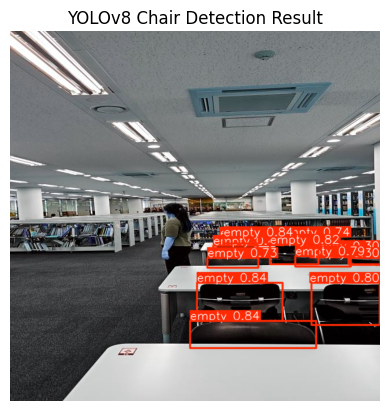

탐지된 박스 수: 12
박스 정보: tensor([[323.3565, 435.1210, 471.1412, 501.4644],
        [311.7078, 501.8615, 529.3880, 548.4188],
        [369.5815, 356.7050, 430.2274, 367.8446],
        [449.8075, 369.7983, 533.0801, 403.9597],
        [521.0935, 435.2295, 639.6984, 508.7141],
        [493.0613, 389.2871, 589.5381, 407.7090],
        [467.0437, 356.8932, 524.6459, 367.3068],
        [341.9759, 392.1035, 429.7695, 409.4218],
        [351.3769, 371.8526, 428.9795, 389.9792],
        [588.7017, 392.8022, 640.0000, 404.4349],
        [585.9073, 380.4149, 640.0000, 403.6036],
        [363.8096, 357.6857, 426.0923, 369.9548]], device='cuda:0')
클래스 정보: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')
신뢰도: tensor([0.8433, 0.8425, 0.8356, 0.8196, 0.8002, 0.7937, 0.7443, 0.7262, 0.4560, 0.2998, 0.2996, 0.1895], device='cuda:0')


In [17]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

# 1. 모델 불러오기
model = YOLO('/content/runs/detect/yolov8_chair2/weights/best.pt')  # 경로 확인 필요

# 2. 이미지 불러오기
image_path = '/content/Beyond.v2i.yolov8/images/train/20250723_122422440_jpg.rf.0160e025a07ff1e1b6ff1e83475873a7.jpg'
image = Image.open(image_path)

# 3. 예측 실행
results = model(image, conf=0.1)  # conf 낮춰보기

# 4. 결과 이미지 시각화
res_plotted = results[0].plot()  # 바운딩 박스가 그려진 이미지 (numpy 배열)

# 5. 이미지 출력
plt.imshow(res_plotted)
plt.axis('off')
plt.title("YOLOv8 Chair Detection Result")
plt.show()

# 6. 결과 출력 (박스가 실제로 있는지 확인)
print("탐지된 박스 수:", len(results[0].boxes))
print("박스 정보:", results[0].boxes.xyxy)
print("클래스 정보:", results[0].boxes.cls)
print("신뢰도:", results[0].boxes.conf)

In [18]:
# 예측된 바운딩 박스 정보 출력
for box in results[0].boxes:
    cls = int(box.cls[0])
    conf = float(box.conf[0])
    xyxy = box.xyxy[0].tolist()
    print(f"Class: {model.names[cls]}, Conf: {conf:.2f}, BBox: {xyxy}")

Class: empty, Conf: 0.84, BBox: [323.35650634765625, 435.12103271484375, 471.14117431640625, 501.46435546875]
Class: empty, Conf: 0.84, BBox: [311.707763671875, 501.86151123046875, 529.3880004882812, 548.4187622070312]
Class: empty, Conf: 0.84, BBox: [369.58148193359375, 356.7049560546875, 430.22735595703125, 367.8446044921875]
Class: empty, Conf: 0.82, BBox: [449.8074951171875, 369.79833984375, 533.080078125, 403.959716796875]
Class: empty, Conf: 0.80, BBox: [521.093505859375, 435.2294921875, 639.6983642578125, 508.714111328125]
Class: empty, Conf: 0.79, BBox: [493.0613098144531, 389.2871398925781, 589.5380859375, 407.7090148925781]
Class: empty, Conf: 0.74, BBox: [467.043701171875, 356.8931884765625, 524.6458740234375, 367.3067626953125]
Class: empty, Conf: 0.73, BBox: [341.97589111328125, 392.10345458984375, 429.76947021484375, 409.42181396484375]
Class: empty, Conf: 0.46, BBox: [351.37689208984375, 371.8525695800781, 428.9794921875, 389.9792175292969]
Class: empty, Conf: 0.30, BBox

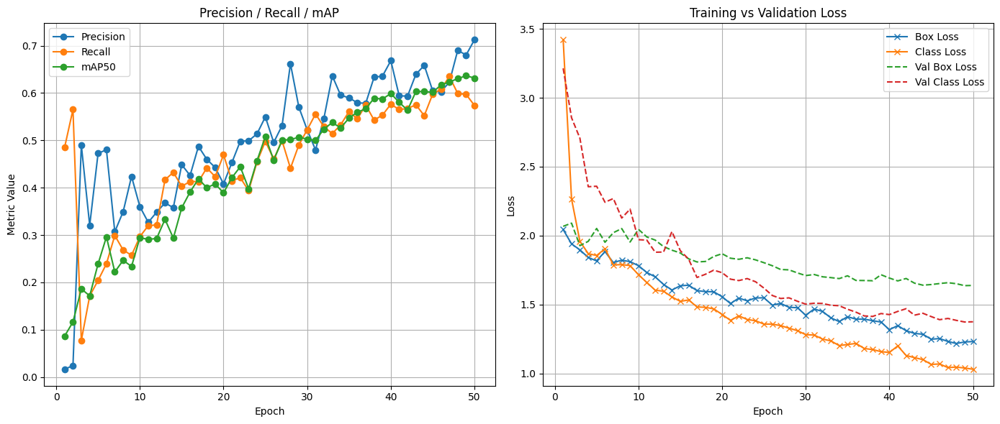

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# 경로: YOLO 학습 결과 디렉토리
results_csv_path = "/content/runs/detect/yolov8_chair2/results.csv"

# CSV 불러오기
assert os.path.exists(results_csv_path), f"CSV 파일 없음: {results_csv_path}"
df = pd.read_csv(results_csv_path)

# 기본 정보
epochs = df.index + 1  # 0부터 시작하므로 +1

# ✅ 그래프 그리기
plt.figure(figsize=(14, 6))

# ---- Accuracy / Precision / Recall ----
plt.subplot(1, 2, 1)
plt.plot(epochs, df["metrics/precision(B)"], label="Precision", marker='o')
plt.plot(epochs, df["metrics/recall(B)"], label="Recall", marker='o')
plt.plot(epochs, df["metrics/mAP50(B)"], label="mAP50", marker='o')
plt.title("Precision / Recall / mAP")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.grid(True)
plt.legend()

# ---- Loss ----
plt.subplot(1, 2, 2)
plt.plot(epochs, df["train/box_loss"], label="Box Loss", marker='x')
plt.plot(epochs, df["train/cls_loss"], label="Class Loss", marker='x')
plt.plot(epochs, df["val/box_loss"], label="Val Box Loss", linestyle="--")
plt.plot(epochs, df["val/cls_loss"], label="Val Class Loss", linestyle="--")
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


image 1/47 /content/Beyond.v2i.yolov8/images/val/20250723_121605896_jpg.rf.4048408f91ba82860d04cce5e236b744.jpg: 640x640 5 emptys, 1 occupied, 8.1ms
image 2/47 /content/Beyond.v2i.yolov8/images/val/20250723_121616620_jpg.rf.d40d1c0ea18795ef9bd495f98e6cf2ef.jpg: 640x640 11 emptys, 2 occupieds, 7.4ms
image 3/47 /content/Beyond.v2i.yolov8/images/val/20250723_121649874_jpg.rf.dda97eb4f18514f39d86fd03880cdd6d.jpg: 640x640 12 emptys, 1 occupied, 7.4ms
image 4/47 /content/Beyond.v2i.yolov8/images/val/20250723_121708525_jpg.rf.441cd1ce150535064252585c706d4d0d.jpg: 640x640 8 emptys, 2 occupieds, 8.3ms
image 5/47 /content/Beyond.v2i.yolov8/images/val/20250723_121735256_jpg.rf.93715dce965a65e239650215aca05fc2.jpg: 640x640 8 emptys, 4 occupieds, 7.6ms
image 6/47 /content/Beyond.v2i.yolov8/images/val/20250723_121809305_jpg.rf.721cee93510d50fa0aaa827143423c22.jpg: 640x640 1 empty, 2 occupieds, 7.4ms
image 7/47 /content/Beyond.v2i.yolov8/images/val/20250723_121815917_jpg.rf.5895cc12c9d37c3fa983ca72c

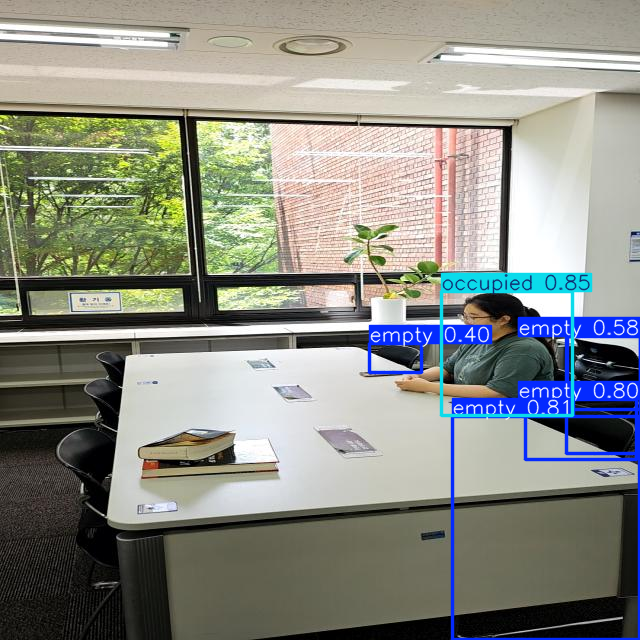

In [21]:
# 검출 실행 (validation 이미지 대상)
val_images_path = '/content/Beyond.v2i.yolov8/images/val'

results = model.predict(
    source=val_images_path,
    conf=0.3,
    save=True
)

# 시각화 결과 보기
results[0].show()

Selected images:


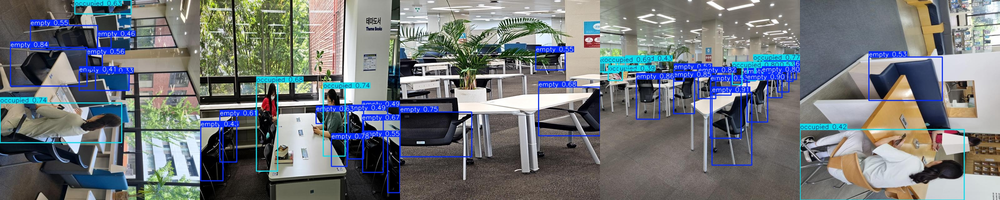

In [28]:
import os
import random
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

val_result_dir = "/content/runs/detect/predict"
img_files = [f for f in os.listdir(val_result_dir) if f.endswith(('.jpg', '.png'))]
sample_imgs = random.sample(img_files, min(5, len(img_files)))

imgs = []
for f in sample_imgs:
    img_path = os.path.join(val_result_dir, f)
    img = cv2.imread(img_path)
    if img is not None:
        # 높이 맞추기 위해 리사이즈 (필요시)
        imgs.append(img)

# 모두 같은 높이로 맞추기 (가장 작은 높이로)
min_height = min(img.shape[0] for img in imgs)
resized_imgs = [cv2.resize(img, (int(img.shape[1]*min_height/img.shape[0]), min_height)) for img in imgs]

# 가로로 붙이기
h_concat = cv2.hconcat(resized_imgs)

print("Selected images:")
cv2_imshow(h_concat)

### 960 x 960

In [25]:
# 모델 학습 시작
model.train(
    data=yaml_path,        # data.yaml 경로
    epochs=50,
    imgsz=960,
    batch=16,
    name="yolov8_chair3"
)

Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/Beyond.v2i.yolov8/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/runs/detect/yolov8_chair2/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=yolov8_chair32, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, pati

train: Scanning /content/Beyond.v2i.yolov8/labels/train.cache... 186 images, 0 backgrounds, 0 corrupt: 100%|██████████| 186/186 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 721.0±491.0 MB/s, size: 69.2 KB)


val: Scanning /content/Beyond.v2i.yolov8/labels/val.cache... 47 images, 0 backgrounds, 0 corrupt: 100%|██████████| 47/47 [00:00<?, ?it/s]


Plotting labels to runs/detect/yolov8_chair32/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 960 train, 960 val
Using 2 dataloader workers
Logging results to runs/detect/yolov8_chair32
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      5.72G      2.273      2.123      1.971        120        960: 100%|██████████| 12/12 [00:06<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.24it/s]

                   all         47        587      0.372      0.158      0.166     0.0624



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      6.08G      2.113      1.894      1.839        215        960: 100%|██████████| 12/12 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         47        587      0.318      0.204       0.17     0.0561



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      6.08G      2.001      1.817      1.749        291        960: 100%|██████████| 12/12 [00:07<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.85it/s]

                   all         47        587      0.325      0.245      0.229     0.0791



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      6.48G      1.861      1.716      1.658        166        960: 100%|██████████| 12/12 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]

                   all         47        587      0.506      0.278      0.317      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      6.48G      1.809      1.681       1.62        221        960: 100%|██████████| 12/12 [00:05<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         47        587      0.413      0.334      0.322      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.48G      1.765       1.65      1.577        183        960: 100%|██████████| 12/12 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.73it/s]

                   all         47        587      0.503      0.443      0.444      0.195



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      6.94G      1.697      1.579      1.527        217        960: 100%|██████████| 12/12 [00:06<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.78it/s]

                   all         47        587      0.508      0.445      0.433      0.196



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      6.94G      1.724      1.566      1.562        202        960: 100%|██████████| 12/12 [00:05<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.46it/s]

                   all         47        587      0.499      0.467      0.442      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      6.94G      1.675      1.523      1.522        230        960: 100%|██████████| 12/12 [00:04<00:00,  2.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.71it/s]

                   all         47        587      0.445       0.41      0.406      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      6.94G      1.651      1.497      1.513        160        960: 100%|██████████| 12/12 [00:05<00:00,  2.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.96it/s]

                   all         47        587      0.562      0.466      0.465      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      6.94G      1.586      1.451      1.479        193        960: 100%|██████████| 12/12 [00:05<00:00,  2.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         47        587      0.602      0.394      0.426      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      6.94G      1.578      1.425      1.445        163        960: 100%|██████████| 12/12 [00:06<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]

                   all         47        587      0.469       0.47      0.439      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      6.94G      1.518      1.398      1.433        193        960: 100%|██████████| 12/12 [00:04<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         47        587      0.531      0.527      0.506      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      6.94G      1.499      1.346      1.412        211        960: 100%|██████████| 12/12 [00:05<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.80it/s]

                   all         47        587      0.512      0.512      0.481      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      6.94G      1.508      1.367      1.421        260        960: 100%|██████████| 12/12 [00:04<00:00,  2.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.35it/s]

                   all         47        587      0.466      0.545      0.484      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50       7.4G      1.508      1.347      1.423        157        960: 100%|██████████| 12/12 [00:05<00:00,  2.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         47        587      0.511      0.517      0.499      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      5.46G      1.497      1.332      1.405        250        960: 100%|██████████| 12/12 [00:06<00:00,  1.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]

                   all         47        587      0.562      0.497      0.508      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      5.46G       1.46      1.323      1.382        370        960: 100%|██████████| 12/12 [00:05<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.94it/s]

                   all         47        587      0.541      0.528      0.515       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      5.46G      1.462      1.302        1.4        206        960: 100%|██████████| 12/12 [00:05<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.05it/s]

                   all         47        587      0.547      0.567      0.548       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      5.46G      1.445      1.281      1.375        189        960: 100%|██████████| 12/12 [00:04<00:00,  2.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         47        587      0.593      0.527      0.552      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      5.46G      1.387      1.244      1.363        192        960: 100%|██████████| 12/12 [00:05<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         47        587      0.589      0.507      0.526       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      5.46G      1.429      1.269      1.388        187        960: 100%|██████████| 12/12 [00:04<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.58it/s]

                   all         47        587      0.567      0.565      0.541      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      5.46G      1.427      1.249      1.368        163        960: 100%|██████████| 12/12 [00:05<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         47        587       0.58      0.573      0.562      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      5.99G       1.42      1.243      1.345        216        960: 100%|██████████| 12/12 [00:05<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.28it/s]

                   all         47        587      0.553      0.564      0.568      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      5.99G      1.405      1.228      1.349        179        960: 100%|██████████| 12/12 [00:04<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         47        587      0.497      0.645      0.561      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      5.99G        1.4      1.224      1.335        224        960: 100%|██████████| 12/12 [00:05<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.95it/s]

                   all         47        587      0.595      0.518      0.532      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      5.99G      1.414      1.212      1.362        127        960: 100%|██████████| 12/12 [00:04<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         47        587      0.594      0.575      0.545      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      5.99G      1.358      1.184      1.333        174        960: 100%|██████████| 12/12 [00:05<00:00,  2.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.08it/s]

                   all         47        587      0.556       0.58      0.552      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      5.99G      1.362       1.19      1.347        210        960: 100%|██████████| 12/12 [00:04<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]

                   all         47        587      0.591      0.576      0.558      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      5.99G      1.323      1.158      1.325        158        960: 100%|██████████| 12/12 [00:05<00:00,  2.07it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]

                   all         47        587      0.607      0.588       0.55      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      5.99G      1.356      1.176      1.326        230        960: 100%|██████████| 12/12 [00:04<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.48it/s]

                   all         47        587      0.575      0.598      0.552       0.27



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      6.01G       1.34      1.144      1.313        249        960: 100%|██████████| 12/12 [00:05<00:00,  2.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         47        587      0.636      0.563      0.567      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      6.01G      1.324      1.147      1.321        200        960: 100%|██████████| 12/12 [00:05<00:00,  2.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.92it/s]

                   all         47        587      0.634       0.54      0.571      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      6.01G      1.288      1.116      1.276        153        960: 100%|██████████| 12/12 [00:04<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]

                   all         47        587      0.624      0.589      0.595      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.02G      1.321      1.141      1.299        159        960: 100%|██████████| 12/12 [00:05<00:00,  2.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.89it/s]

                   all         47        587      0.639      0.571      0.588      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      6.02G      1.299      1.136      1.297        237        960: 100%|██████████| 12/12 [00:04<00:00,  2.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         47        587      0.595      0.584      0.578       0.28



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      6.04G      1.321      1.128      1.301        189        960: 100%|██████████| 12/12 [00:05<00:00,  2.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         47        587      0.599      0.572      0.569      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      6.04G      1.308      1.113      1.292        260        960: 100%|██████████| 12/12 [00:05<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         47        587      0.608      0.596      0.577      0.279



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      6.04G      1.317      1.102      1.285        159        960: 100%|██████████| 12/12 [00:05<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]

                   all         47        587      0.608      0.573      0.574      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      6.04G      1.289      1.116      1.295        144        960: 100%|██████████| 12/12 [00:05<00:00,  2.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         47        587      0.585      0.593      0.571       0.28


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      6.04G      1.299      1.137      1.314        138        960: 100%|██████████| 12/12 [00:09<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.38it/s]

                   all         47        587      0.587      0.603      0.588      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      6.04G      1.274      1.083      1.281         87        960: 100%|██████████| 12/12 [00:05<00:00,  2.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.07it/s]

                   all         47        587       0.64      0.573      0.599      0.287



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      6.04G      1.242      1.049      1.262        128        960: 100%|██████████| 12/12 [00:05<00:00,  2.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.43it/s]

                   all         47        587      0.603      0.586      0.578       0.29



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      6.04G      1.262      1.058      1.306        142        960: 100%|██████████| 12/12 [00:05<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  2.00it/s]

                   all         47        587      0.612      0.572       0.59      0.293



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      6.04G       1.21      1.013      1.247        137        960: 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         47        587       0.61      0.595      0.593      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      6.04G      1.255      1.043      1.277        109        960: 100%|██████████| 12/12 [00:04<00:00,  2.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]

                   all         47        587      0.579      0.605      0.595      0.285



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      6.04G      1.206      1.033      1.252         94        960: 100%|██████████| 12/12 [00:05<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         47        587      0.578      0.623      0.593      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      6.04G      1.194      1.011      1.247        115        960: 100%|██████████| 12/12 [00:04<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         47        587      0.576      0.625      0.595      0.284



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      6.04G      1.224      1.035      1.257        166        960: 100%|██████████| 12/12 [00:05<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]

                   all         47        587      0.568      0.634      0.601      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      6.04G      1.211      1.012      1.252        159        960: 100%|██████████| 12/12 [00:04<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.06it/s]

                   all         47        587      0.596      0.612        0.6      0.288



50 epochs completed in 0.104 hours.
Optimizer stripped from runs/detect/yolov8_chair32/weights/last.pt, 6.3MB
Optimizer stripped from runs/detect/yolov8_chair32/weights/best.pt, 6.3MB

Validating runs/detect/yolov8_chair32/weights/best.pt...
Ultralytics 8.3.173 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 3,006,038 parameters, 0 gradients, 8.1 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.53it/s]


                   all         47        587       0.62      0.563       0.59      0.293
                 empty         47        499      0.561      0.581      0.553      0.291
              occupied         40         88      0.679      0.545      0.627      0.296
Speed: 0.6ms preprocess, 6.2ms inference, 0.0ms loss, 4.2ms postprocess per image
Results saved to runs/detect/yolov8_chair32


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x78f298eb8350>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804


0: 960x960 11 emptys, 12.1ms
Speed: 8.3ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 960, 960)


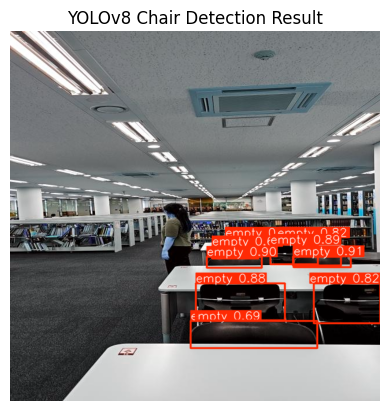

탐지된 박스 수: 11
박스 정보: tensor([[490.5875, 389.6738, 589.9091, 408.0193],
        [340.5103, 390.8533, 435.3949, 409.5970],
        [450.6723, 369.4551, 532.5466, 403.4802],
        [321.8317, 436.6790, 475.8622, 500.0851],
        [462.9071, 357.3175, 525.9368, 366.0776],
        [525.2935, 436.4469, 640.0000, 505.2389],
        [312.5549, 501.0898, 531.8145, 548.1677],
        [349.7319, 372.0966, 429.2286, 393.5200],
        [372.4497, 357.5029, 432.7311, 367.5084],
        [465.8043, 357.3995, 506.8848, 366.3115],
        [489.7307, 390.2739, 572.1560, 405.4712]], device='cuda:0')
클래스 정보: tensor([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.], device='cuda:0')
신뢰도: tensor([0.9088, 0.9016, 0.8890, 0.8761, 0.8227, 0.8173, 0.6947, 0.6671, 0.6588, 0.3036, 0.1029], device='cuda:0')


In [27]:
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt

# 1. 모델 불러오기
model = YOLO('/content/runs/detect/yolov8_chair32/weights/best.pt')  # 경로 확인 필요

# 2. 이미지 불러오기
image_path = '/content/Beyond.v2i.yolov8/images/train/20250723_122422440_jpg.rf.0160e025a07ff1e1b6ff1e83475873a7.jpg'  # 640과 동일한 이미지
image = Image.open(image_path)

# 3. 예측 실행
results = model(image, conf=0.1)  # conf 낮춰보기

# 4. 결과 이미지 시각화
res_plotted = results[0].plot()  # 바운딩 박스가 그려진 이미지 (numpy 배열)

# 5. 이미지 출력
plt.imshow(res_plotted)
plt.axis('off')
plt.title("YOLOv8 Chair Detection Result")
plt.show()

# 6. 결과 출력 (박스가 실제로 있는지 확인)
print("탐지된 박스 수:", len(results[0].boxes))
print("박스 정보:", results[0].boxes.xyxy)
print("클래스 정보:", results[0].boxes.cls)
print("신뢰도:", results[0].boxes.conf)

In [29]:
# 예측된 바운딩 박스 정보 출력
for box in results[0].boxes:
    cls = int(box.cls[0])
    conf = float(box.conf[0])
    xyxy = box.xyxy[0].tolist()
    print(f"Class: {model.names[cls]}, Conf: {conf:.2f}, BBox: {xyxy}")

Class: empty, Conf: 0.91, BBox: [490.5874938964844, 389.67376708984375, 589.9091186523438, 408.019287109375]
Class: empty, Conf: 0.90, BBox: [340.51025390625, 390.85333251953125, 435.3948669433594, 409.5970458984375]
Class: empty, Conf: 0.89, BBox: [450.67230224609375, 369.455078125, 532.546630859375, 403.48016357421875]
Class: empty, Conf: 0.88, BBox: [321.83172607421875, 436.678955078125, 475.8621520996094, 500.08514404296875]
Class: empty, Conf: 0.82, BBox: [462.9071044921875, 357.3174743652344, 525.936767578125, 366.07763671875]
Class: empty, Conf: 0.82, BBox: [525.29345703125, 436.4468688964844, 640.0, 505.2388610839844]
Class: empty, Conf: 0.69, BBox: [312.5549011230469, 501.08978271484375, 531.814453125, 548.167724609375]
Class: empty, Conf: 0.67, BBox: [349.73187255859375, 372.0965576171875, 429.2286071777344, 393.5199890136719]
Class: empty, Conf: 0.66, BBox: [372.44970703125, 357.5028991699219, 432.73114013671875, 367.50836181640625]
Class: empty, Conf: 0.30, BBox: [465.80429

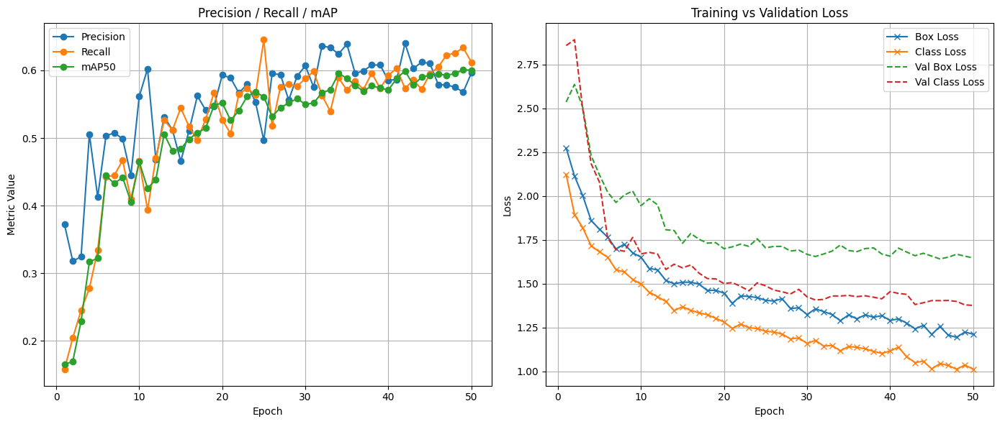

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import os

# 경로: YOLO 학습 결과 디렉토리
results_csv_path = "/content/runs/detect/yolov8_chair32/results.csv"

# CSV 불러오기
assert os.path.exists(results_csv_path), f"CSV 파일 없음: {results_csv_path}"
df = pd.read_csv(results_csv_path)

# 기본 정보
epochs = df.index + 1  # 0부터 시작하므로 +1

# ✅ 그래프 그리기
plt.figure(figsize=(14, 6))

# ---- Accuracy / Precision / Recall ----
plt.subplot(1, 2, 1)
plt.plot(epochs, df["metrics/precision(B)"], label="Precision", marker='o')
plt.plot(epochs, df["metrics/recall(B)"], label="Recall", marker='o')
plt.plot(epochs, df["metrics/mAP50(B)"], label="mAP50", marker='o')
plt.title("Precision / Recall / mAP")
plt.xlabel("Epoch")
plt.ylabel("Metric Value")
plt.grid(True)
plt.legend()

# ---- Loss ----
plt.subplot(1, 2, 2)
plt.plot(epochs, df["train/box_loss"], label="Box Loss", marker='x')
plt.plot(epochs, df["train/cls_loss"], label="Class Loss", marker='x')
plt.plot(epochs, df["val/box_loss"], label="Val Box Loss", linestyle="--")
plt.plot(epochs, df["val/cls_loss"], label="Val Class Loss", linestyle="--")
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()


image 1/47 /content/Beyond.v2i.yolov8/images/val/20250723_121605896_jpg.rf.4048408f91ba82860d04cce5e236b744.jpg: 960x960 6 emptys, 1 occupied, 12.5ms
image 2/47 /content/Beyond.v2i.yolov8/images/val/20250723_121616620_jpg.rf.d40d1c0ea18795ef9bd495f98e6cf2ef.jpg: 960x960 13 emptys, 3 occupieds, 12.1ms
image 3/47 /content/Beyond.v2i.yolov8/images/val/20250723_121649874_jpg.rf.dda97eb4f18514f39d86fd03880cdd6d.jpg: 960x960 9 emptys, 1 occupied, 12.1ms
image 4/47 /content/Beyond.v2i.yolov8/images/val/20250723_121708525_jpg.rf.441cd1ce150535064252585c706d4d0d.jpg: 960x960 9 emptys, 2 occupieds, 12.1ms
image 5/47 /content/Beyond.v2i.yolov8/images/val/20250723_121735256_jpg.rf.93715dce965a65e239650215aca05fc2.jpg: 960x960 11 emptys, 3 occupieds, 12.1ms
image 6/47 /content/Beyond.v2i.yolov8/images/val/20250723_121809305_jpg.rf.721cee93510d50fa0aaa827143423c22.jpg: 960x960 3 emptys, 2 occupieds, 12.1ms
image 7/47 /content/Beyond.v2i.yolov8/images/val/20250723_121815917_jpg.rf.5895cc12c9d37c3fa9

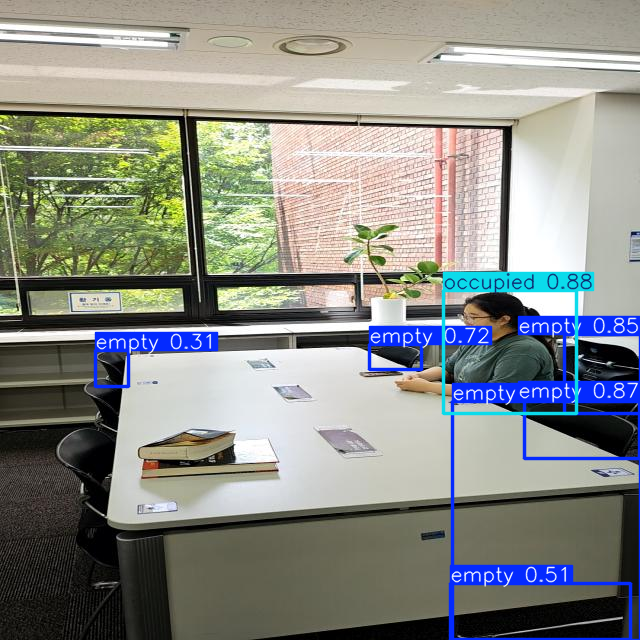

In [31]:
# 검출 실행 (validation 이미지 대상)
val_images_path = '/content/Beyond.v2i.yolov8/images/val'

results = model.predict(
    source=val_images_path,
    conf=0.3,
    save=True
)

# 시각화 결과 보기
results[0].show()

Selected images:


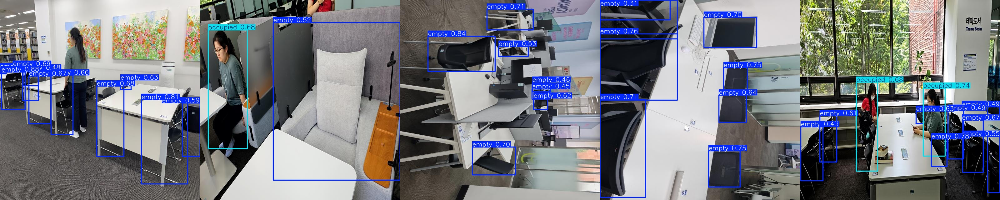

In [32]:
import os
import random
import cv2
from google.colab.patches import cv2_imshow
import numpy as np

val_result_dir = "/content/runs/detect/predict"
img_files = [f for f in os.listdir(val_result_dir) if f.endswith(('.jpg', '.png'))]
sample_imgs = random.sample(img_files, min(5, len(img_files)))

imgs = []
for f in sample_imgs:
    img_path = os.path.join(val_result_dir, f)
    img = cv2.imread(img_path)
    if img is not None:
        # 높이 맞추기 위해 리사이즈 (필요시)
        imgs.append(img)

# 모두 같은 높이로 맞추기 (가장 작은 높이로)
min_height = min(img.shape[0] for img in imgs)
resized_imgs = [cv2.resize(img, (int(img.shape[1]*min_height/img.shape[0]), min_height)) for img in imgs]

# 가로로 붙이기
h_concat = cv2.hconcat(resized_imgs)

print("Selected images:")
cv2_imshow(h_concat)